Geothermal machine learning analysis: Great Basin - INGENIOUS Data
---

### This notebook is a part of the GeoThermalCloud.jl: A Machine Learning framework for Geothermal Resources Exploration.


![GeoThermalCloud](geothermalcloud.png)

## Introduction

- The Great Basin is the largest area of contiguous endorheic watersheds in North America

- It spans nearly all of Nevada, much of Oregon and Utah, and portions of California, Idaho, Wyoming, and Baja California, Mexico

- The Great Basin includes multiple geothermal reservoirs ranging from low- to high-temperature

- The Great Basin has huge potential geothermal potential 

- Further explorations requires an understanding of the local/regional as well as spatial/temporal patterns in various geothermal-related attributes  

- Here, we apply our unsupervised machine learning method **NMFk** to analyze the available geothermal and geochemical data to understand better the spatial distribution of the hydrothermal resources

#### **Geothermal**: Temperature, GTM Quartz, GTM Chalcedony, Heat flow, Two m temperature 
#### **Groundwater chemistry**: Al, B, Ba, Be, Br, Ca, Cl, HCO3, K, Li, Mg, Na
#### **Geology/geophysics**: Depth to the basement, Gravity anomaly, Magnetic anomaly
#### **Rock displacement**: Strain rate, Dilation rate, Shear rate

- @JLD.load "data/Xnl.jld" Xnl xlmin xlmax zflag coords attributes_all

- W, H, fitquality, robustness, aic = NMFk.execute(Xnl, nkrange, nruns; resultdir=resultdir, casefilename="nmfk-nl", load=true)

- NMFk.plot_signal_selecton(nkrange, fitquality, robustness; xtitle="Number of signatures", ytitle="Normalized performance metrics", figuredir=figuredirpost)

- Sorder, Wclusters, Hclusters = NMFk.clusterresults(NMFk.getks(nkrange, robustness[nkrange], 0.5), W, H, string.(collect(1:npoints)), attributes_all; lon=xcoords, lat=ycoords, resultdir=resultdirpost, figuredir=figuredirpost, ordersignal=:Wcount, Hcasefilename="attributes", Wcasefilename="locations", biplotcolor=:WH, sortmag=false, biplotlabel=:H, point_size_nolabel=2Gadfly.pt, point_size_label=4Gadfly.pt)


## GeoThermalCloud installation

If **GeoThermalCloud** is not installed, first execute in the Julia REPL `import Pkg; Pkg.add("GeoThermalCloud"); import Pkg; Pkg.add("NMFk"); Pkg.add("Mads"); Pkg.add("DelimitedFiles"); Pkg.add("JLD"); Pkg.add("Gadfly"); Pkg.add("Cairo"); Pkg.add("Fontconfig"); Pkg.add("Kriging"); Pkg.add("GMT");`.

In [38]:
import GeoThermalCloud
import NMFk
import Mads
import DelimitedFiles
import JLD
import Gadfly
import Cairo
import Fontconfig
import Kriging
import GMT

## Load and pre-process the data

### Setup the working directory containing the Great Basin data

In [39]:
#cd(joinpath(GeoThermalCloud.dir, "GreatBasin"));
include("../gmtplot_greatbasin.jl");

### Load the data file

In [40]:
@JLD.load "../data/Xnl.jld" Xnl xlmin xlmax zflag coords attributes_all

6-element Vector{Symbol}:
 :Xnl
 :xlmin
 :xlmax
 :zflag
 :coords
 :attributes_all

In [41]:
fauld_pfa_map_points, hs = DelimitedFiles.readdlm("../data/jimfauldsPFAdata.csv", ',', header=true)
greatbasin_hotsprings, hhs = DelimitedFiles.readdlm("../data/hot_springs_great_basin.csv", ',', header=true)

(Any["Bog hot spring" 41.921453 -118.802135; "The hot spring" 41.420944 -117.386659; … ; "Casa Diablo hot spring" 35.983242 -114.748867; "Coso volcanic field" 35.983242 -114.748867], AbstractString["hot_springs" "lat" "lon"])

### See names of the data attributes (matrix columns)

In [42]:
attributes_all;
for att in attributes_all
    println(att)
end

Temperature [C]
GTM Quartz [C]
GTM Chalcedony [C]
Al [ppm]
B [ppm]
Ba [ppm]
Be [ppm]
Br [ppm]
Ca [ppm]
Cl [ppm]
HCO3 [ppm]
K [ppm]
Li [ppm]
Mg [ppm]
Na [ppm]
Heat flow [W/m²]
Two m temperature [C]
Depth to the basement [m]
Gravity anomaly [mGal]
Magnetic anomaly [nT]
Strain rate [nS⁻¹]
Dilation rate [nS⁻¹]
Shear rate [nS⁻¹]


### Define location coordinates

In [43]:
xcoords = coords[:,1];
ycoords = coords[:,2];
xgrid, ygrid = NMFk.griddata(xcoords, ycoords; stepvalue=0.1)
npoints = size(coords, 1)

14258

### Map locations

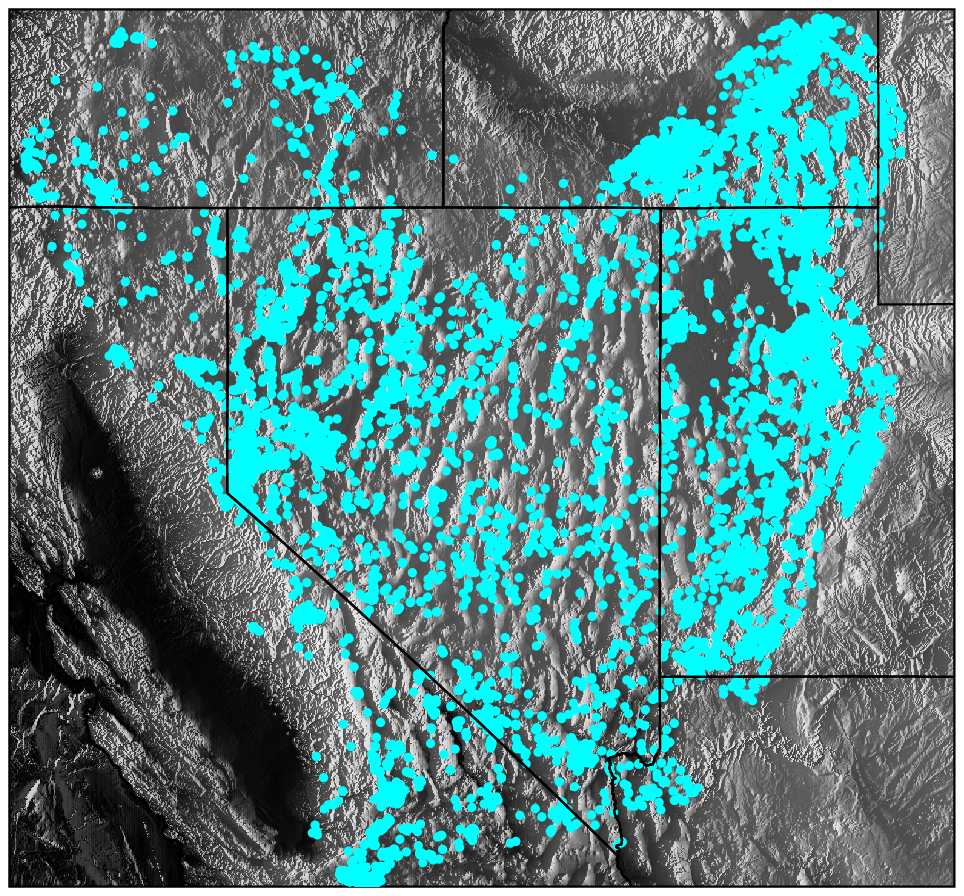

In [44]:
GMT.grdimage("../data/greatbasin-v3.nc", proj=:Mercator, shade=(azimuth=100, norm="e0.8"),
	color=GMT.makecpt(color=:grayC, transparency=10, range=(0,5000,500), continuous=true),
	figsize=8, conf=(MAP_FRAME_TYPE="plain", MAP_GRID_PEN_PRIMARY="thinnest,gray,.",
	MAP_GRID_CROSS_SIZE_SECONDARY=0.1, MAP_FRAME_PEN=0.5, MAP_TICK_PEN_PRIMARY=0.1,
	MAP_TICK_LENGTH_PRIMARY=0.01), frame=(axis="lrtb"))
GMT.plot!(xcoords, ycoords, fill=:cyan, marker=:c, markersize=0.075, coast=(proj=:Mercator, 
    DCW=(country="US.UT,US.NV,US.CA,US.AZ,US.OR,US.ID", pen=(0.5,:black))),
    fmt=:png, savefig="../data/locations", show=true);
Mads.display("../data/locations.png")

## Let's see data at a few locations

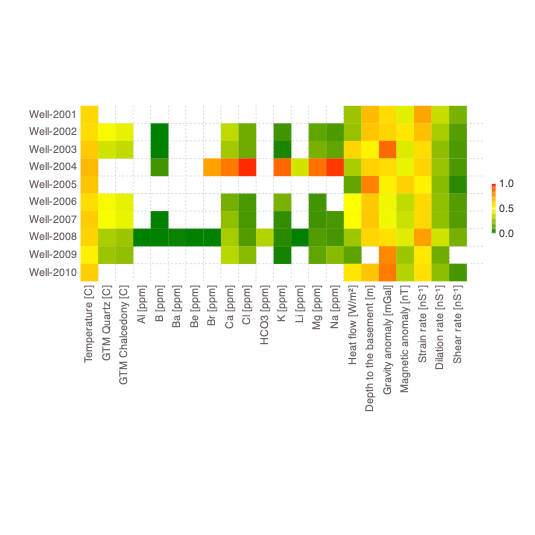

In [45]:
NMFk.plotmatrix(Xnl[2001:2010,:], xticks=attributes_all, yticks=["Well-$(i)" for i =2001:2010])

## Let's see histogram of attributes at all locations

┌ Info: Temperature [C]
└ @ NMFk /Users/ahmmedb/.julia/packages/NMFk/qlpSw/src/NMFkPreprocess.jl:61
┌ Info: Histogram weights:
└ @ NMFk /Users/ahmmedb/.julia/packages/NMFk/qlpSw/src/NMFkPlot.jl:272


11-element Vector{Int64}:
    3
    0
    6
    4
  202
 2380
 8426
 1894
  763
  215
    1

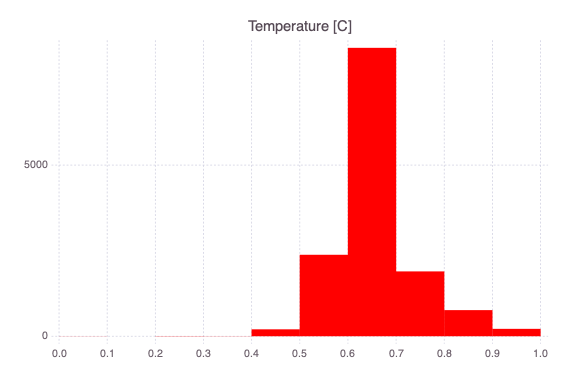

11-element Vector{Int64}:
   17
   71
 1158
 2983
 3165
  946
  201
  102
   31
    8
    1

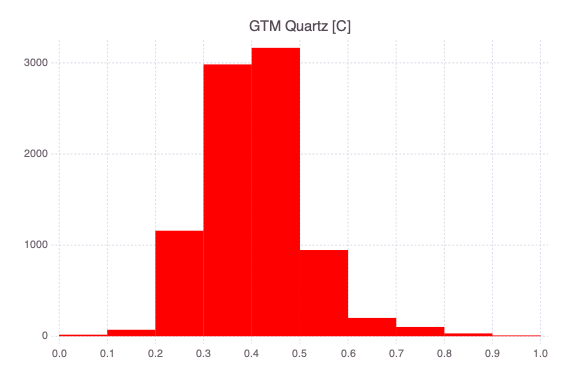

Temperature [C]: Min 0.0 Max 1.0 StdDev 0.081594035 Skewness 0.882341 Count 13894


┌ Info: GTM Quartz [C]
└ @ NMFk /Users/ahmmedb/.julia/packages/NMFk/qlpSw/src/NMFkPreprocess.jl:61
┌ Info: Histogram weights:
└ @ NMFk /Users/ahmmedb/.julia/packages/NMFk/qlpSw/src/NMFkPlot.jl:272


11-element Vector{Int64}:
   22
  172
 1764
 3585
 2400
  472
  173
   63
   27
    4
    1

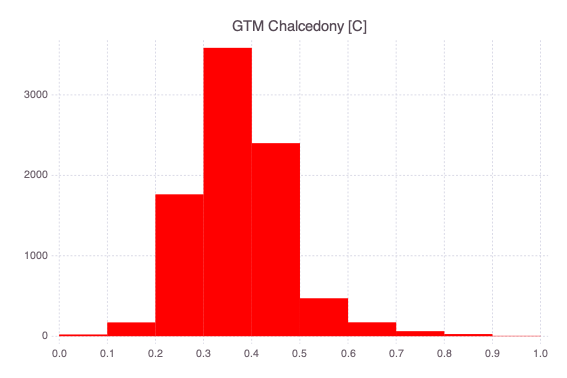

GTM Quartz [C]: Min 0.0 Max 1.0 StdDev 0.10522732 Skewness 0.6946973 Count 8683


┌ Info: GTM Chalcedony [C]
└ @ NMFk /Users/ahmmedb/.julia/packages/NMFk/qlpSw/src/NMFkPreprocess.jl:61
┌ Info: Histogram weights:
└ @ NMFk /Users/ahmmedb/.julia/packages/NMFk/qlpSw/src/NMFkPlot.jl:272


11-element Vector{Int64}:
 1344
    2
    1
    2
    5
    6
    1
    0
    0
    0
    1

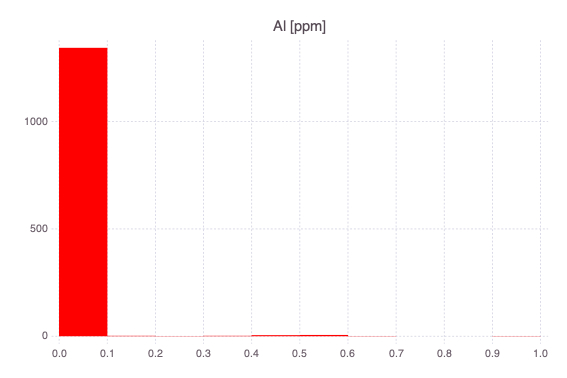

GTM Chalcedony [C]: Min 0.0 Max 1.0 StdDev 0.10320138 Skewness 0.8679954 Count 8683


┌ Info: Al [ppm]
└ @ NMFk /Users/ahmmedb/.julia/packages/NMFk/qlpSw/src/NMFkPreprocess.jl:61
┌ Info: Histogram weights:
└ @ NMFk /Users/ahmmedb/.julia/packages/NMFk/qlpSw/src/NMFkPlot.jl:272


11-element Vector{Int64}:
 4913
  308
  107
   56
   46
   13
    8
    3
    5
    2
    1

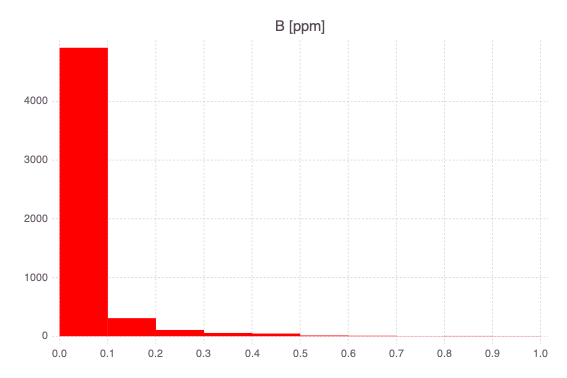

Al [ppm]: Min 0.0 Max 1.0 StdDev 0.057156254 Skewness 10.313462 Count 1362


┌ Info: B [ppm]
└ @ NMFk /Users/ahmmedb/.julia/packages/NMFk/qlpSw/src/NMFkPreprocess.jl:61
┌ Info: Histogram weights:
└ @ NMFk /Users/ahmmedb/.julia/packages/NMFk/qlpSw/src/NMFkPlot.jl:272


11-element Vector{Int64}:
 2504
    8
    3
    0
    0
    0
    0
    0
    0
    0
    1

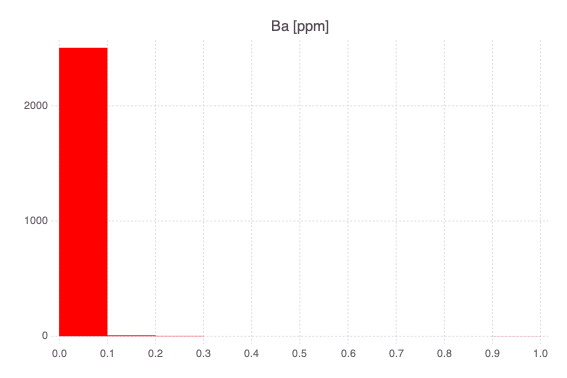

B [ppm]: Min 0.0 Max 1.0 StdDev 0.0859073 Skewness 4.7634273 Count 5462


┌ Info: Ba [ppm]
└ @ NMFk /Users/ahmmedb/.julia/packages/NMFk/qlpSw/src/NMFkPreprocess.jl:61
┌ Info: Histogram weights:
└ @ NMFk /Users/ahmmedb/.julia/packages/NMFk/qlpSw/src/NMFkPlot.jl:272


11-element Vector{Int64}:
 1633
    3
    1
    1
    1
    0
    0
    0
    0
    0
    1

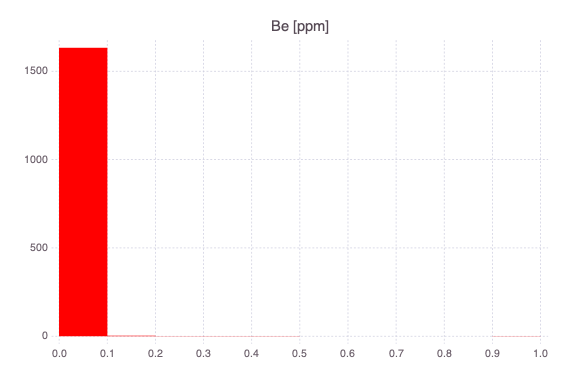

11-element Vector{Int64}:
 1771
   48
   20
    9
   13
   18
   28
   18
    7
    2
    1

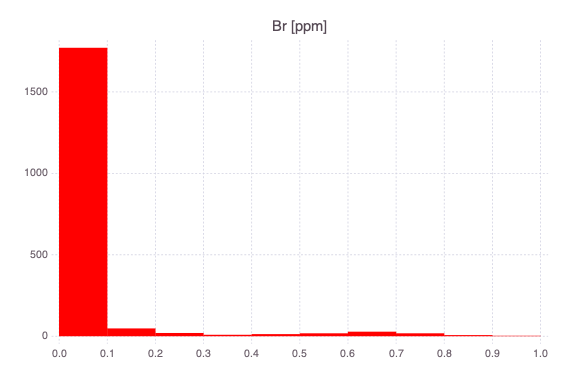

Ba [ppm]: Min 0.0 Max 1.0 StdDev 0.023985103 Skewness 30.14277 Count 2516
Be [ppm]: Min 0.0 Max 1.0 StdDev 0.030026369 Skewness 25.677284 Count 1640


┌ Info: Be [ppm]
└ @ NMFk /Users/ahmmedb/.julia/packages/NMFk/qlpSw/src/NMFkPreprocess.jl:61
┌ Info: Histogram weights:
└ @ NMFk /Users/ahmmedb/.julia/packages/NMFk/qlpSw/src/NMFkPlot.jl:272
┌ Info: Br [ppm]
└ @ NMFk /Users/ahmmedb/.julia/packages/NMFk/qlpSw/src/NMFkPreprocess.jl:61
┌ Info: Histogram weights:
└ @ NMFk /Users/ahmmedb/.julia/packages/NMFk/qlpSw/src/NMFkPlot.jl:272


11-element Vector{Int64}:
  616
 1085
 1947
 3409
 1390
  470
  244
  137
  135
   34
    1

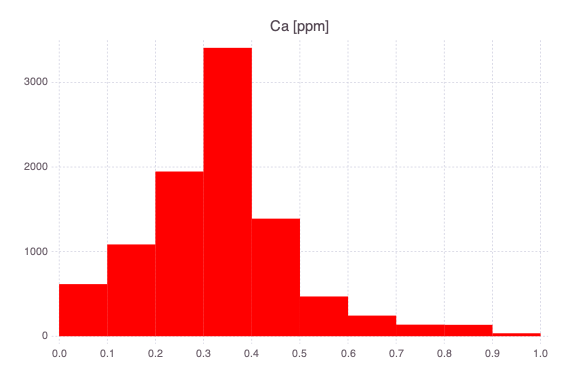

Br [ppm]: Min 0.0 Max 1.0 StdDev 0.13954704 Skewness 4.1656346 Count 1935


┌ Info: Ca [ppm]
└ @ NMFk /Users/ahmmedb/.julia/packages/NMFk/qlpSw/src/NMFkPreprocess.jl:61
┌ Info: Histogram weights:
└ @ NMFk /Users/ahmmedb/.julia/packages/NMFk/qlpSw/src/NMFkPlot.jl:272


11-element Vector{Int64}:
 3474
 2890
 1531
  999
  524
  312
   99
   62
   61
  138
    1

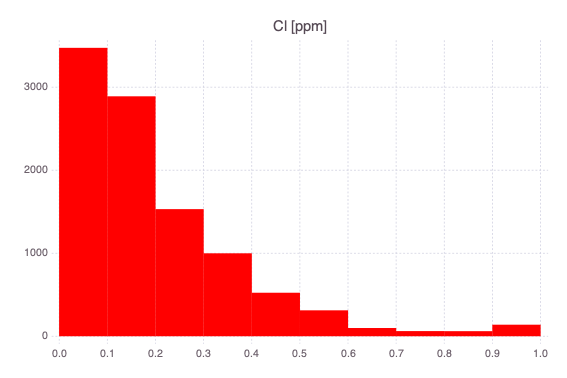

Ca [ppm]: Min 0.0 Max 1.0 StdDev 0.15761715 Skewness 0.7680004 Count 9468


┌ Info: Cl [ppm]
└ @ NMFk /Users/ahmmedb/.julia/packages/NMFk/qlpSw/src/NMFkPreprocess.jl:61
┌ Info: Histogram weights:
└ @ NMFk /Users/ahmmedb/.julia/packages/NMFk/qlpSw/src/NMFkPlot.jl:272


11-element Vector{Int64}:
   20
   88
  568
 1606
  931
  157
   36
    2
    4
    0
    1

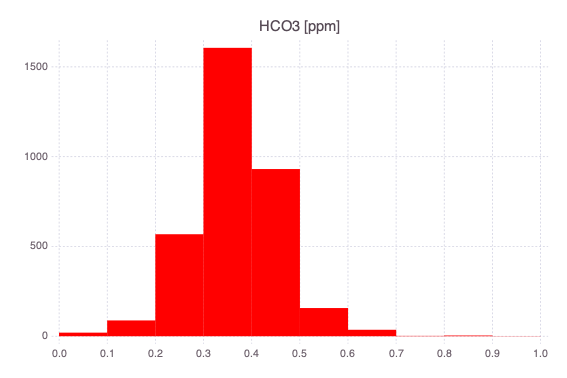

11-element Vector{Int64}:
 6397
 1091
  461
  206
   77
   26
   32
   56
   62
   37
    1

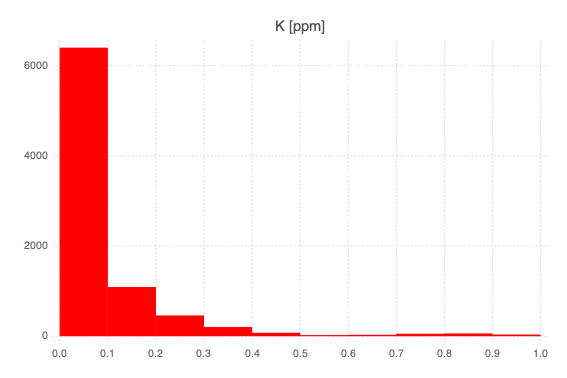

Cl [ppm]: Min 0.0 Max 1.0 StdDev 0.17869674 Skewness 1.849905 Count 10091
HCO3 [ppm]: Min 0.0 Max 1.0 StdDev 0.08960027 Skewness 0.23711707 Count 3413


┌ Info: HCO3 [ppm]
└ @ NMFk /Users/ahmmedb/.julia/packages/NMFk/qlpSw/src/NMFkPreprocess.jl:61
┌ Info: Histogram weights:
└ @ NMFk /Users/ahmmedb/.julia/packages/NMFk/qlpSw/src/NMFkPlot.jl:272
┌ Info: K [ppm]
└ @ NMFk /Users/ahmmedb/.julia/packages/NMFk/qlpSw/src/NMFkPreprocess.jl:61
┌ Info: Histogram weights:
└ @ NMFk /Users/ahmmedb/.julia/packages/NMFk/qlpSw/src/NMFkPlot.jl:272


11-element Vector{Int64}:
 2623
   74
   22
   42
   27
    6
    1
    3
    6
    4
    1

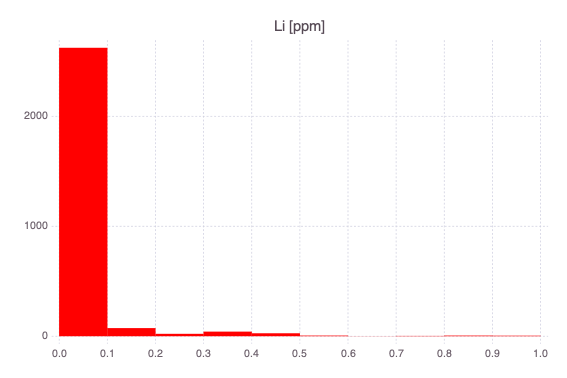

K [ppm]: Min 0.0 Max 1.0 StdDev 0.13650717 Skewness 3.6689942 Count 8446


┌ Info: Li [ppm]
└ @ NMFk /Users/ahmmedb/.julia/packages/NMFk/qlpSw/src/NMFkPreprocess.jl:61
┌ Info: Histogram weights:
└ @ NMFk /Users/ahmmedb/.julia/packages/NMFk/qlpSw/src/NMFkPlot.jl:272


11-element Vector{Int64}:
 2826
 3703
 1794
  515
  179
   60
   51
   59
   77
   31
    1

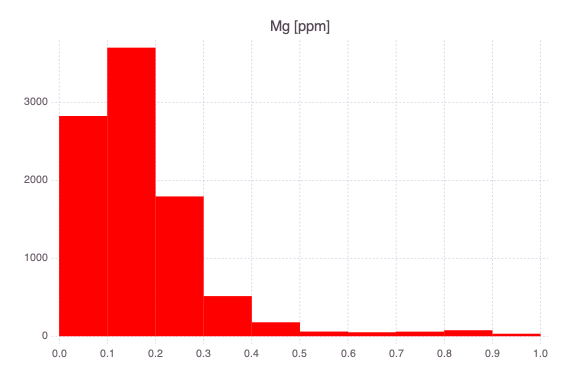

Li [ppm]: Min 0.0 Max 1.0 StdDev 0.09294478 Skewness 5.757586 Count 2809


┌ Info: Mg [ppm]
└ @ NMFk /Users/ahmmedb/.julia/packages/NMFk/qlpSw/src/NMFkPreprocess.jl:61
┌ Info: Histogram weights:
└ @ NMFk /Users/ahmmedb/.julia/packages/NMFk/qlpSw/src/NMFkPlot.jl:272


11-element Vector{Int64}:
 1903
 2933
 1853
 1088
  473
  249
   76
   55
   53
  130
    1

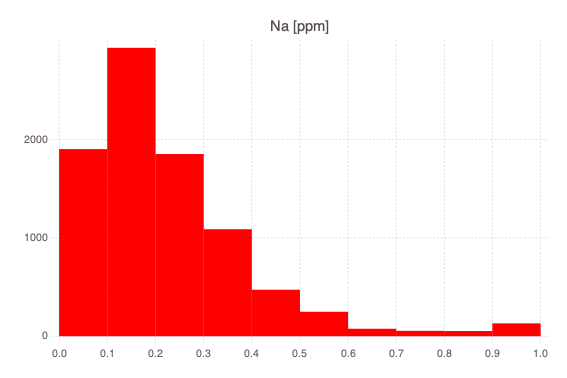

Mg [ppm]: Min 0.0 Max 1.0 StdDev 0.14092101 Skewness 2.2964318 Count 9296


┌ Info: Na [ppm]
└ @ NMFk /Users/ahmmedb/.julia/packages/NMFk/qlpSw/src/NMFkPreprocess.jl:61
┌ Info: Histogram weights:
└ @ NMFk /Users/ahmmedb/.julia/packages/NMFk/qlpSw/src/NMFkPlot.jl:272


11-element Vector{Int64}:
   63
  459
 3547
 1654
 1265
 1455
 1802
 1362
 1008
    9
    1

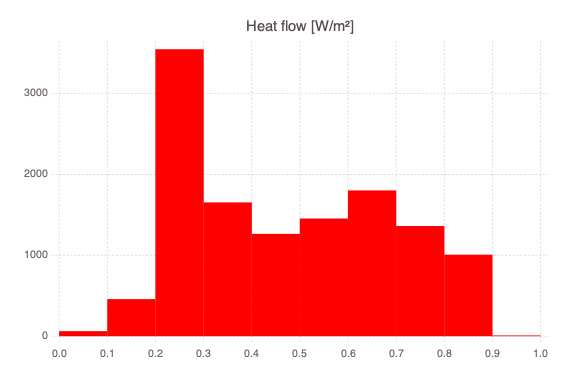

Na [ppm]: Min 0.0 Max 1.0 StdDev 0.17009427 Skewness 1.8498077 Count 8814


┌ Info: Heat flow [W/m²]
└ @ NMFk /Users/ahmmedb/.julia/packages/NMFk/qlpSw/src/NMFkPreprocess.jl:61
┌ Info: Histogram weights:
└ @ NMFk /Users/ahmmedb/.julia/packages/NMFk/qlpSw/src/NMFkPlot.jl:272


11-element Vector{Int64}:
   37
   83
  109
  281
  392
  414
 1154
  370
  513
   92
    1

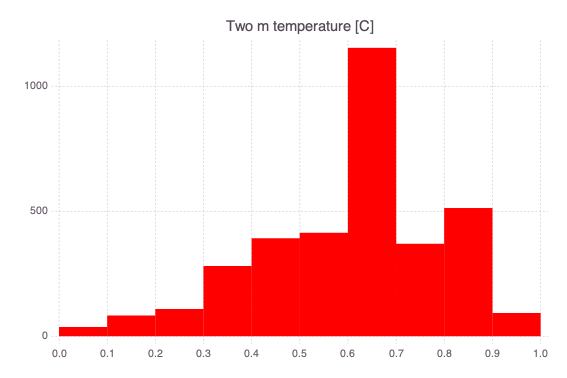

Heat flow [W/m²]: Min 0.0 Max 1.0 StdDev 0.20735803 Skewness 0.28030607 Count 12625


┌ Info: Two m temperature [C]
└ @ NMFk /Users/ahmmedb/.julia/packages/NMFk/qlpSw/src/NMFkPreprocess.jl:61
┌ Info: Histogram weights:
└ @ NMFk /Users/ahmmedb/.julia/packages/NMFk/qlpSw/src/NMFkPlot.jl:272


11-element Vector{Int64}:
  177
  219
  113
  227
  854
 2310
 4357
 2744
  555
   90
    1

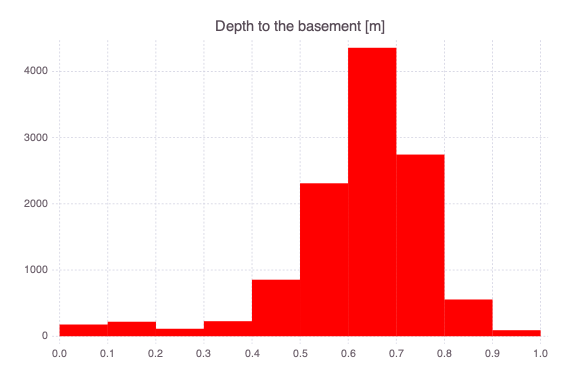

Two m temperature [C]: Min 0.0 Max 1.0 StdDev 0.18826053 Skewness -0.63658994 Count 3446


┌ Info: Depth to the basement [m]
└ @ NMFk /Users/ahmmedb/.julia/packages/NMFk/qlpSw/src/NMFkPreprocess.jl:61
┌ Info: Histogram weights:
└ @ NMFk /Users/ahmmedb/.julia/packages/NMFk/qlpSw/src/NMFkPlot.jl:272


11-element Vector{Int64}:
   57
   58
  364
 1322
 2207
 2907
 2352
 1092
  597
  229
    1

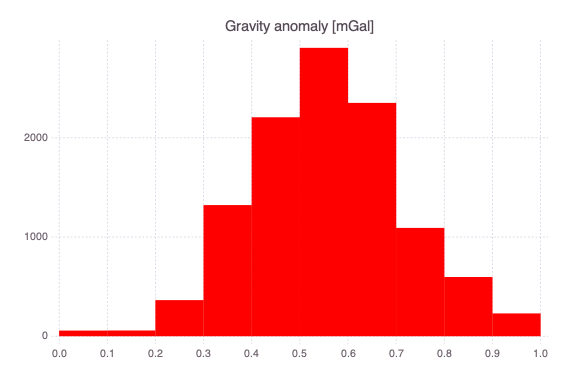

Depth to the basement [m]: Min 0.0 Max 1.0 StdDev 0.14709915 Skewness -1.506334 Count 11647


┌ Info: Gravity anomaly [mGal]
└ @ NMFk /Users/ahmmedb/.julia/packages/NMFk/qlpSw/src/NMFkPreprocess.jl:61
┌ Info: Histogram weights:
└ @ NMFk /Users/ahmmedb/.julia/packages/NMFk/qlpSw/src/NMFkPlot.jl:272


11-element Vector{Int64}:
    8
  148
 1336
 5500
 3259
  600
  221
  112
    1
    0
    1

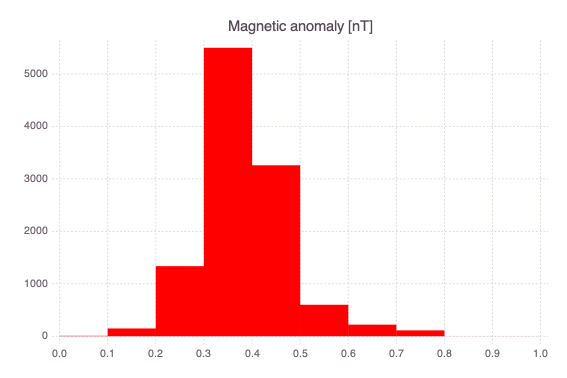

Gravity anomaly [mGal]: Min 0.0 Max 1.0 StdDev 0.15584789 Skewness 0.11866951 Count 11186


┌ Info: Magnetic anomaly [nT]
└ @ NMFk /Users/ahmmedb/.julia/packages/NMFk/qlpSw/src/NMFkPreprocess.jl:61
┌ Info: Histogram weights:
└ @ NMFk /Users/ahmmedb/.julia/packages/NMFk/qlpSw/src/NMFkPlot.jl:272


11-element Vector{Int64}:
   27
  335
  883
 1113
  967
 2156
 1975
 1749
 1328
  656
    1

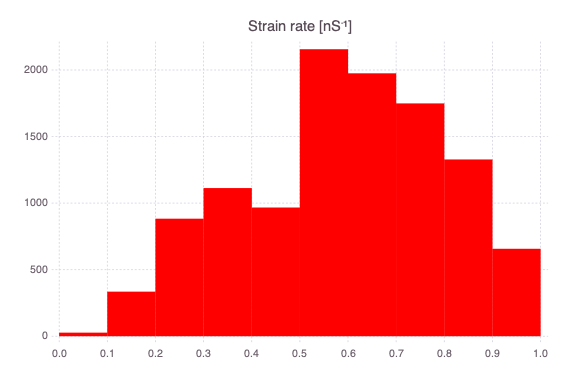

Magnetic anomaly [nT]: Min 0.0 Max 1.0 StdDev 0.09067469 Skewness 0.8852474 Count 11186


┌ Info: Strain rate [nS⁻¹]
└ @ NMFk /Users/ahmmedb/.julia/packages/NMFk/qlpSw/src/NMFkPreprocess.jl:61
┌ Info: Histogram weights:
└ @ NMFk /Users/ahmmedb/.julia/packages/NMFk/qlpSw/src/NMFkPlot.jl:272


11-element Vector{Int64}:
  228
 3526
 4501
 2372
  276
  175
   20
   17
   60
   14
    1

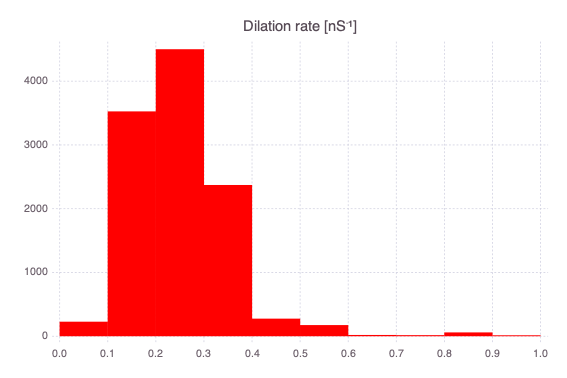

Strain rate [nS⁻¹]: Min 0.0 Max 1.0 StdDev 0.20528059 Skewness -0.28322566 Count 11190


┌ Info: Dilation rate [nS⁻¹]
└ @ NMFk /Users/ahmmedb/.julia/packages/NMFk/qlpSw/src/NMFkPreprocess.jl:61
┌ Info: Histogram weights:
└ @ NMFk /Users/ahmmedb/.julia/packages/NMFk/qlpSw/src/NMFkPlot.jl:272


11-element Vector{Int64}:
 4905
 2405
  571
  124
  390
  485
  561
  604
  357
    7
    1

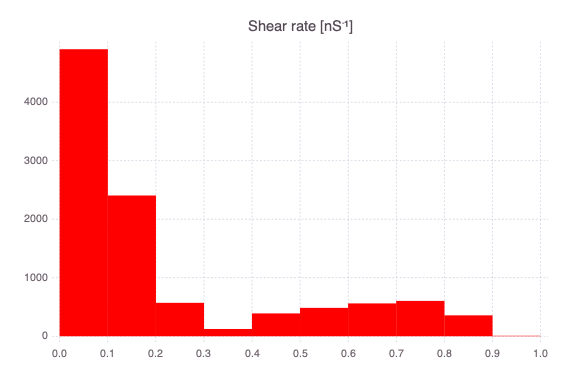

Dilation rate [nS⁻¹]: Min 0.0 Max 1.0 StdDev 0.1031278 Skewness 2.1294093 Count 11190
Shear rate [nS⁻¹]: Min 0.0 Max 1.0 StdDev 0.2555649 Skewness 1.2559115 Count 10410
Name Min Max StdDev Count (non-NaN's)
Temperature [C] 0.0 1.0 0.081594035 0.882341 13894
GTM Quartz [C] 0.0 1.0 0.10522732 0.6946973 8683
GTM Chalcedony [C] 0.0 1.0 0.10320138 0.8679954 8683
Al [ppm] 0.0 1.0 0.057156254 10.313462 1362
B [ppm] 0.0 1.0 0.0859073 4.7634273 5462
Ba [ppm] 0.0 1.0 0.023985103 30.14277 2516
Be [ppm] 0.0 1.0 0.030026369 25.677284 1640
Br [ppm] 0.0 1.0 0.13954704 4.1656346 1935
Ca [ppm] 0.0 1.0 0.15761715 0.7680004 9468
Cl [ppm] 0.0 1.0 0.17869674 1.849905 10091
HCO3 [ppm] 0.0 1.0 0.08960027 0.23711707 3413
K [ppm] 0.0 1.0 0.13650717 3.6689942 8446
Li [ppm] 0.0 1.0 0.09294478 5.757586 2809
Mg [ppm] 0.0 1.0 0.14092101 2.2964318 9296
Na [ppm] 0.0 1.0 0.17009427 1.8498077 8814
Heat flow [W/m²] 0.0 1.0 0.20735803 0.28030607 12625
Two m temperature [C] 0.0 1.0 0.18826053 -0.63658994 3446
Depth to the

┌ Info: Shear rate [nS⁻¹]
└ @ NMFk /Users/ahmmedb/.julia/packages/NMFk/qlpSw/src/NMFkPreprocess.jl:61
┌ Info: Histogram weights:
└ @ NMFk /Users/ahmmedb/.julia/packages/NMFk/qlpSw/src/NMFkPlot.jl:272
┌ Info: Attributes
└ @ NMFk /Users/ahmmedb/.julia/packages/NMFk/qlpSw/src/NMFkPreprocess.jl:77


In [47]:
attributes, min, max, stdDev, counts = NMFk.datanalytics(Xnl, attributes_all; dims=2);

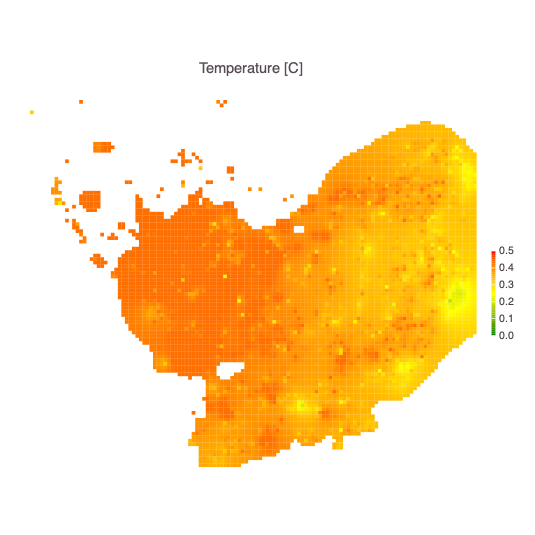

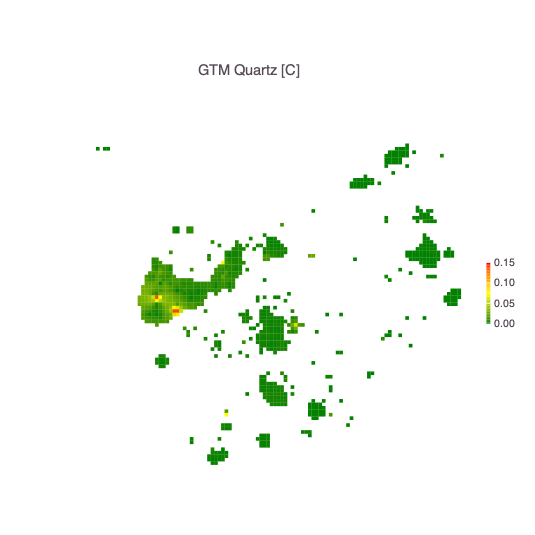

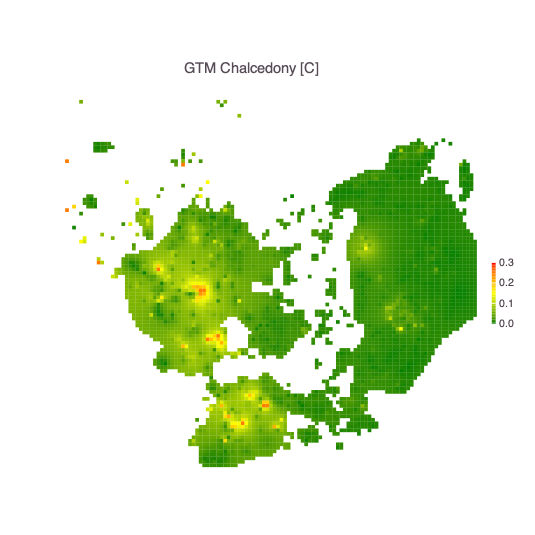

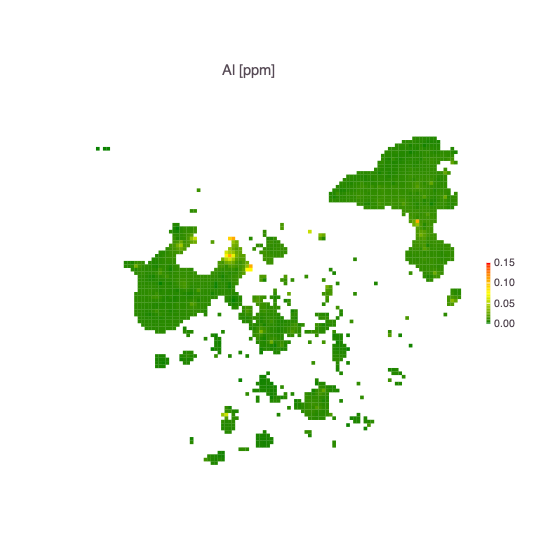

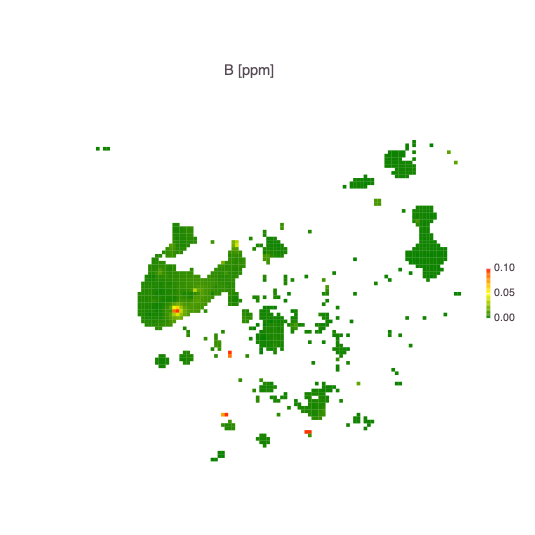

...

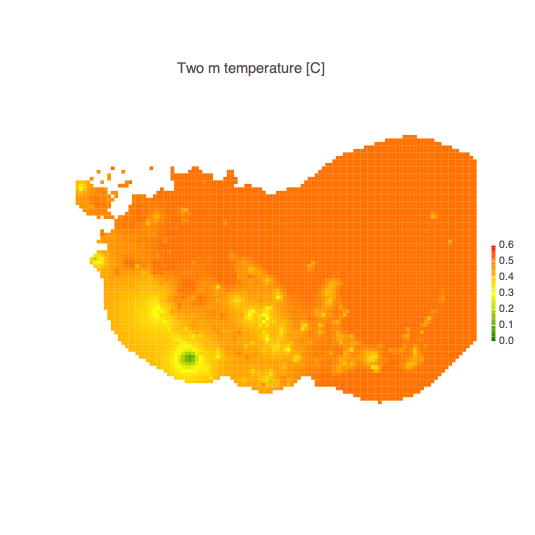

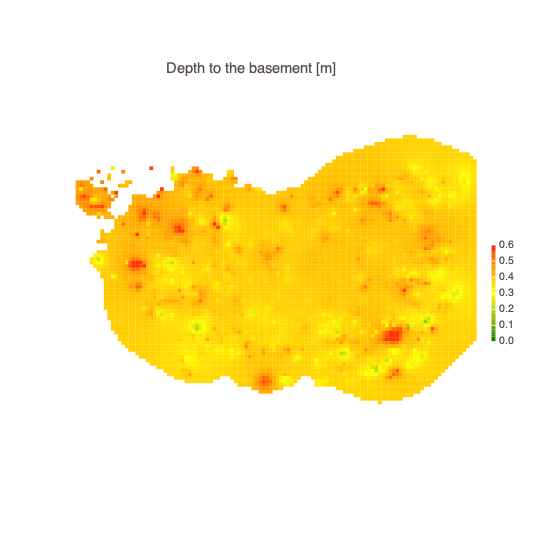

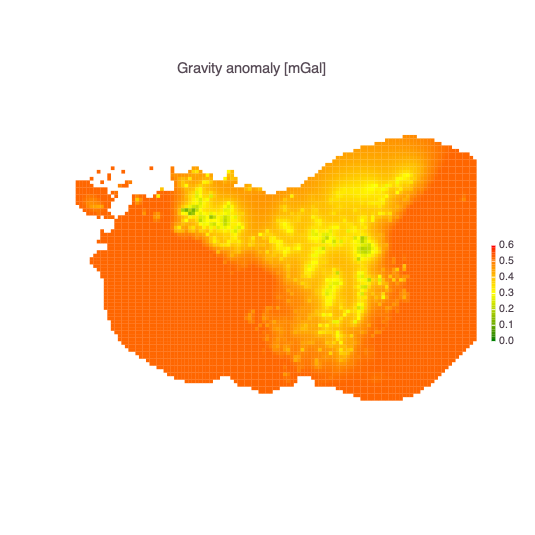

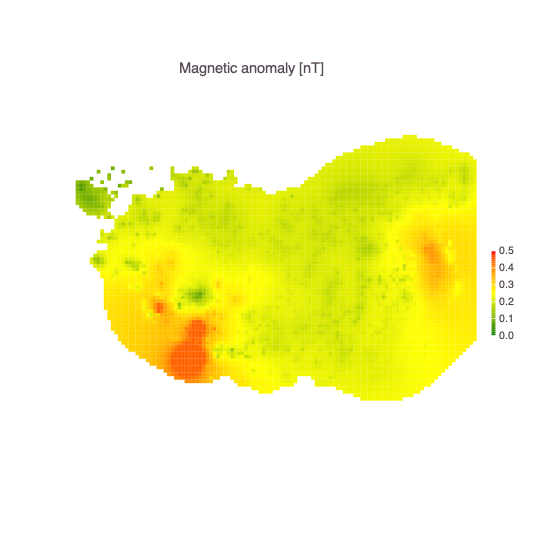

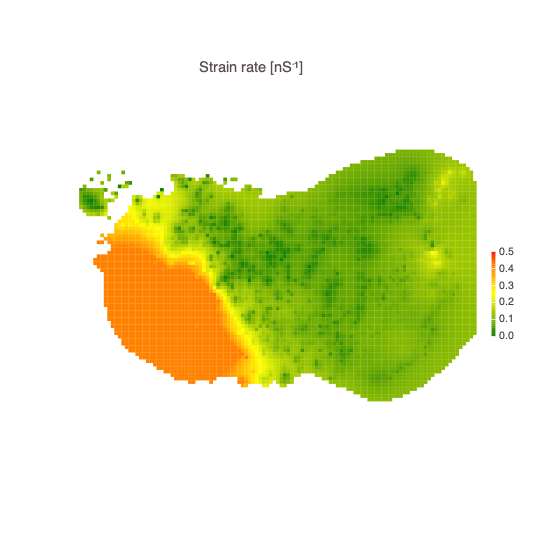

BoundsError: BoundsError: attempt to access 14258×21 Matrix{Float32} at index [1:14258, 22]

In [70]:
coord = permutedims([xcoords ycoords])

xgrid, ygrid = NMFk.griddata(xcoords, ycoords; stepvalue=0.1)

for i = 1:nattributes
	inversedistancefield = Array{Float64}(undef, length(xgrid), length(ygrid))
	v = X[:,i]
	iz = .!isnan.(v)
	icoord = coord[:,iz]
	v = v[iz]
	for (i, x) in enumerate(xgrid), (j, y) in enumerate(ygrid)
		inversedistancefield[i, j] = Kriging.inversedistance(permutedims([x y]), icoord, v, 2; cutoff=1000)[1]
	end
	imax = NMFk.maximumnan(inversedistancefield)
	imin = NMFk.minimumnan(inversedistancefield)
	NMFk.plotmatrix(rotl90(inversedistancefield); quiet=false, filename="maps-data/Attribute_$(attributes[i])_map_inversedistance.png", title="$(attributes_all[i])", maxvalue=imin + (imax - imin)/ 2)
end

## Missing percentage

In [48]:
missing_percentage = ((14258 .- counts) / 14258)*100;
for (i, attribute) in enumerate(attributes_all)
    println(attribute, ": ", missing_percentage[i])
end

Temperature [C]: 2.552952728292888
GTM Quartz [C]: 39.10085565998036
GTM Chalcedony [C]: 39.10085565998036
Al [ppm]: 90.4474680880909
B [ppm]: 61.691681862813866
Ba [ppm]: 82.35376630663487
Be [ppm]: 88.4976855098892
Br [ppm]: 86.42867162294851
Ca [ppm]: 33.59517463879927
Cl [ppm]: 29.22569785383644
HCO3 [ppm]: 76.06256136905597
K [ppm]: 40.7630803759293
Li [ppm]: 80.29877963248703
Mg [ppm]: 34.801514938981626
Na [ppm]: 38.182073222050775
Heat flow [W/m²]: 11.453219245335951
Two m temperature [C]: 75.83111235797448
Depth to the basement [m]: 18.312526301023986
Gravity anomaly [mGal]: 21.545798849768552
Magnetic anomaly [nT]: 21.545798849768552
Strain rate [nS⁻¹]: 21.517744424182915
Dilation rate [nS⁻¹]: 21.517744424182915
Shear rate [nS⁻¹]: 26.988357413381962


- Close to complete records are available only for `Temperature`.

- Data for `Al, Ba, Be, Br`, and `Two m temperature`,  are heavily missing.

- Even though the dataset is very sparse, our ML methods can analyze the inputs.

- Most of the commonly used ML methods cannot process datasets that are sparse.

- Furthermore, different attributes in the Great Basin dataset cover different areas.

- This is demonstrated in the maps generated below.

### Define a range for the number of signatures to be explored 

In [49]:
nkrange = 2:9;

#### Define the number of NMF runs to be executed

The higher the NMF runs, the better.
In addition, convergence has already been explored using different numbers of NMF runs.

In [50]:
nruns = 100;

### Define directory with exsiting model runs

In [51]:
resultdir = "../results-nl-$(nruns)"
resultdirpost = "../results-postprocessing-nl-$(nruns)"
figuredirpost = "../figures-postprocessing-nl-$(nruns)"
mapdirpost = "../maps-postprocessing-nl-$(nruns)"

"../maps-postprocessing-nl-100"

## Perform ML analyses

The **NMFk** algorithm factorizes the normalized data matrix `Xn` into `W` and `H` matrices.
For more information, check out the [**NMFk** website](https://github.com/SmartTensors/NMFk.jl)

In [52]:
W, H, fitquality, robustness, aic = NMFk.execute(Xnl, nkrange, nruns; resultdir=resultdir, casefilename="nmfk-nl-10", load=true)
W, H, fitquality, robustness, aic = NMFk.load(nkrange, nruns; resultdir=resultdir, casefilename="nmfk-nl-10")

Signals:  2 Fit:     2476.653 Silhouette:    0.7524031 AIC:    -711151.9 Signal order: [1, 2]
Signals:  3 Fit:     1599.463 Silhouette:    0.9542045 AIC:    -761027.2 Signal order: [1, 2, 3]
Signals:  4 Fit:      1165.23 Silhouette:    0.5133235 AIC:    -789287.6 Signal order: [1, 2, 3, 4]
Signals:  5 Fit:     867.5413 Silhouette:    0.6504804 AIC:    -813648.1 Signal order: [1, 2, 3, 4, 5]
Signals:  6 Fit:     653.5137 Silhouette:    0.6599746 AIC:    -835907.8 Signal order: [1, 2, 3, 4, 5, 6]
Signals:  7 Fit:     487.4213 Silhouette:     0.144672 AIC:    -859949.8 Signal order: [1, 2, 3, 4, 5, 6, 7]
Signals:  8 Fit:     368.7921 Silhouette:   -0.2189191 AIC:    -881419.5 Signal order: [1, 2, 3, 4, 5, 6, 7, 8]
Signals:  9 Fit:     276.4423 Silhouette:    0.1725209 AIC:    -904563.8 Signal order: [1, 2, 3, 4, 5, 6, 7, 8, 9]
Signals:  2 Fit:     2476.653 Silhouette:    0.7524031 AIC:    -711151.9
Signals:  3 Fit:     1599.463 Silhouette:    0.9542045 AIC:    -761027.2
Signals:  4 Fit:  

┌ Info: Results
└ @ NMFk /Users/ahmmedb/.julia/packages/NMFk/qlpSw/src/NMFkExecute.jl:15
┌ Info: Optimal solution: 6 signals
└ @ NMFk /Users/ahmmedb/.julia/packages/NMFk/qlpSw/src/NMFkExecute.jl:23


Signals:  7 Fit:     487.4213 Silhouette:     0.144672 AIC:    -859949.8 Signal order: [1, 2, 3, 4, 5, 6, 7]
Signals:  8 Fit:     368.7921 Silhouette:   -0.2189191 AIC:    -881419.5 Signal order: [1, 2, 3, 4, 5, 6, 7, 8]
Signals:  9 Fit:     276.4423 Silhouette:    0.1725209 AIC:    -904563.8 Signal order: [1, 2, 3, 4, 5, 6, 7, 8, 9]


┌ Info: Optimal solution: 6 signals
└ @ NMFk /Users/ahmmedb/.julia/packages/NMFk/qlpSw/src/NMFkIO.jl:31


(Matrix{Float32}[Matrix{Float32}(undef, 0, 0), [3.176202 1.4574627; 3.3870852 0.0055959187; … ; 0.1871628 7.315604; 6.959046 7.752001f-8], [4.979283 0.1578334 7.0835036f-16; 4.1261554 0.0040589515 7.0835036f-16; … ; 1.973965f-15 0.08543308 7.3753424; 3.5377822 2.0076337 1.1991211], [4.8793774 0.9084889 0.20328373 2.859644f-9; 4.872621 0.36455834 0.007539979 7.044937f-10; … ; 2.0970695f-6 4.9282904 0.035624035 0.5281955; 2.3565035 0.78209126 2.174378 4.419197], [3.0282485 1.2058253 … 0.28591427 0.044051766; 3.535266 8.079045f-16 … 0.8478046 5.579888f-16; … ; 0.007093968 5.053539 … 0.10679157 0.014470244; 0.0017606164 5.380276f-11 … 4.4535284 1.8632823], [1.1597427 2.4986355 … 0.0043821577 1.4500873; 3.5275888 5.724948f-16 … 4.870781f-16 0.69249445; … ; 3.7732345f-15 3.144615 … 0.008501095 0.6150619; 7.479658f-16 3.6187966 … 1.4357172 1.9224292], [3.0917318 0.2454361 … 0.7451473 0.89798737; 3.9012241 0.19451855 … 0.7224986 0.47997144; … ; 1.5463825 1.8314552 … 5.091342f-16 1.6056983f-14;

Here, the **NMFk** results are loaded from a prior ML run.

As seen from the output above, the NMFk analyses identified that the optimal number of geothermal signatures in the dataset **3**.

Solutions with a number of signatures less than **4** are underfitting.

Solutions with a number of signatures greater than **6** are overfitting and unacceptable.

The set of acceptable solutions are defined by the **NMFk** algorithm as follows:

In [53]:
NMFk.getks(nkrange, robustness[nkrange], 0.5)

5-element Vector{Int64}:
 2
 3
 4
 5
 6

The acceptable solutions contain **4, 5,** and **6** signatures.

### Post-processing NMFk results

#### Number of signatures

Below is a plot representing solution quality (fit) and silhouette width (robustness) for different numbers of signatures `k`:

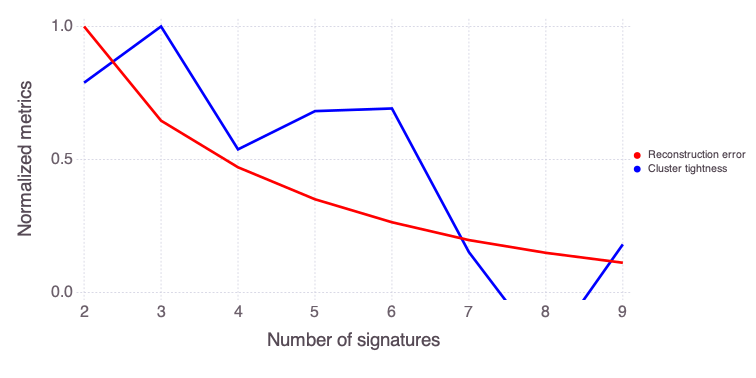

In [54]:
NMFk.plot_feature_selecton(nkrange, fitquality, robustness; xtitle="Number of signatures", figuredir=figuredirpost, names=["Reconstruction error", "Cluster tightness"])

The plot above also demonstrates that the acceptable solutions contain 2 to 6 signatures.
Note, a solution is accepted if the robustness >0.25.

#### Analysis of the optimal solution

The ML solution with the optimal number of signatures (6) is further analyzed as follows:

┌ Info: Number of signals: 3
└ @ NMFk /Users/ahmmedb/.julia/packages/NMFk/qlpSw/src/NMFkPostprocess.jl:287
┌ Info: Attributes (signals=3)
└ @ NMFk /Users/ahmmedb/.julia/packages/NMFk/qlpSw/src/NMFkPostprocess.jl:291
┌ Warning: type Clustering.KmeansResult{Core.Array{Core.Float32,2},Core.Float32,Core.Int64} not present in workspace; reconstructing
└ @ JLD /Users/ahmmedb/.julia/packages/JLD/S6t6A/src/jld_types.jl:697
┌ Info: Robust k-means analysis results are loaded from file ../results-postprocessing-nl-100/Hmatrix-3-3_23-1000.jld!
└ @ NMFk /Users/ahmmedb/.julia/packages/NMFk/qlpSw/src/NMFkCluster.jl:71
┌ Warning: Procedure to find unique signals could not identify a solution ...
└ @ NMFk /Users/ahmmedb/.julia/packages/NMFk/qlpSw/src/NMFkCluster.jl:188
┌ Warning: Procedure to find unique signals could not identify a solution ...
└ @ NMFk /Users/ahmmedb/.julia/packages/NMFk/qlpSw/src/NMFkCluster.jl:188
┌ Warning: Procedure to find unique signals could not identify a solution ...
└ @ NMF

8×2 Matrix{Any}:
 "Two m temperature [C]"      1.0
 "Depth to the basement [m]"  0.866483
 "Gravity anomaly [mGal]"     0.854358
 "Temperature [C]"            0.851818
 "Magnetic anomaly [nT]"      0.516721
 "HCO3 [ppm]"                 0.509106
 "GTM Quartz [C]"             0.491553
 "GTM Chalcedony [C]"         0.448224

4×2 Matrix{Any}:
 "Strain rate [nS⁻¹]"    1.0
 "Shear rate [nS⁻¹]"     0.860364
 "Heat flow [W/m²]"      0.723322
 "Dilation rate [nS⁻¹]"  0.345219

11×2 Matrix{Any}:
 "Cl [ppm]"  1.0
 "Na [ppm]"  0.897799
 "K [ppm]"   0.538043
 "Ca [ppm]"  0.451343
 "Mg [ppm]"  0.401319
 "Br [ppm]"  0.270722
 "B [ppm]"   0.194695
 "Li [ppm]"  0.150694
 "Al [ppm]"  0.062792
 "Be [ppm]"  0.0294533
 "Ba [ppm]"  0.0276254

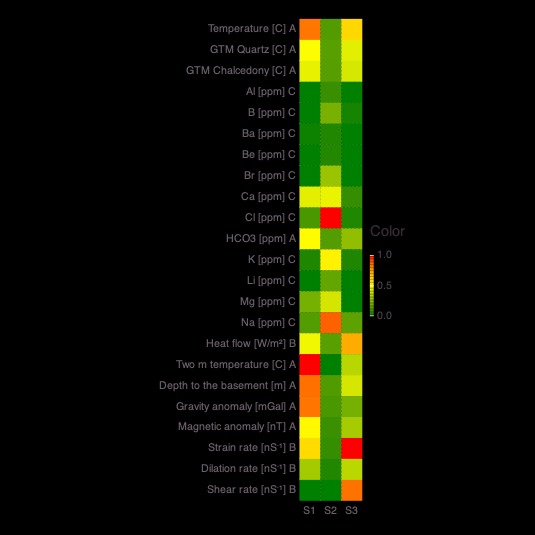

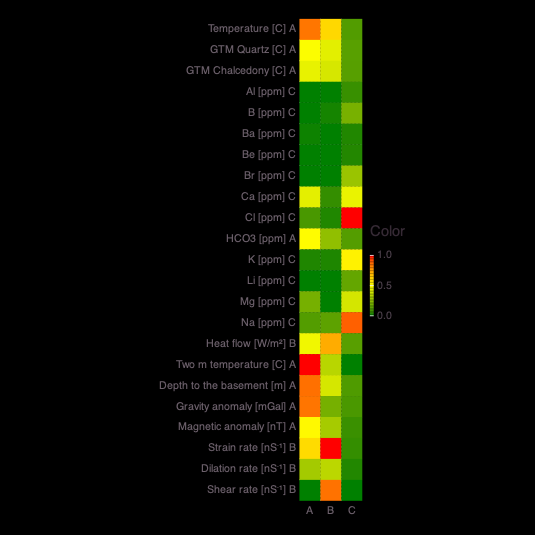

┌ Warning: Procedure to find unique signals could not identify a solution ...
└ @ NMFk /Users/ahmmedb/.julia/packages/NMFk/qlpSw/src/NMFkCluster.jl:188
┌ Warning: Procedure to find unique signals could not identify a solution ...
└ @ NMFk /Users/ahmmedb/.julia/packages/NMFk/qlpSw/src/NMFkCluster.jl:188
┌ Warning: Procedure to find unique signals could not identify a solution ...
└ @ NMFk /Users/ahmmedb/.julia/packages/NMFk/qlpSw/src/NMFkCluster.jl:188
┌ Info: Signal B -> A Count: 8
└ @ NMFk /Users/ahmmedb/.julia/packages/NMFk/qlpSw/src/NMFkPostprocess.jl:413
┌ Info: Signal C -> B Count: 4
└ @ NMFk /Users/ahmmedb/.julia/packages/NMFk/qlpSw/src/NMFkPostprocess.jl:413
┌ Info: Signal A -> C Count: 11
└ @ NMFk /Users/ahmmedb/.julia/packages/NMFk/qlpSw/src/NMFkPostprocess.jl:413
┌ Info: Signal A (S1) (k-means clustering)
└ @ NMFk /Users/ahmmedb/.julia/packages/NMFk/qlpSw/src/NMFkPostprocess.jl:430
┌ Info: Signal B (S3) (k-means clustering)
└ @ NMFk /Users/ahmmedb/.julia/packages/NMFk/qlpSw/s

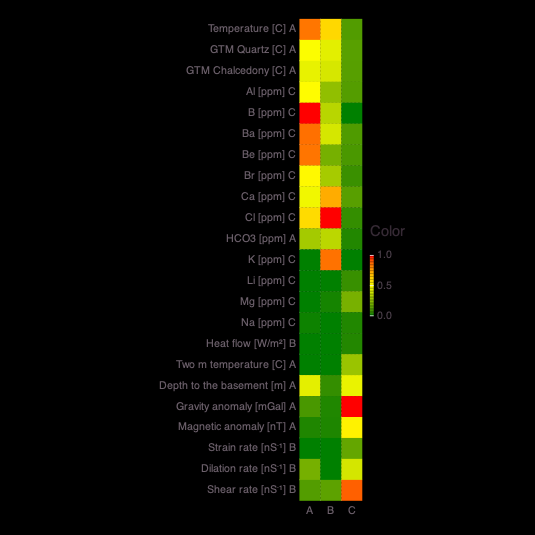

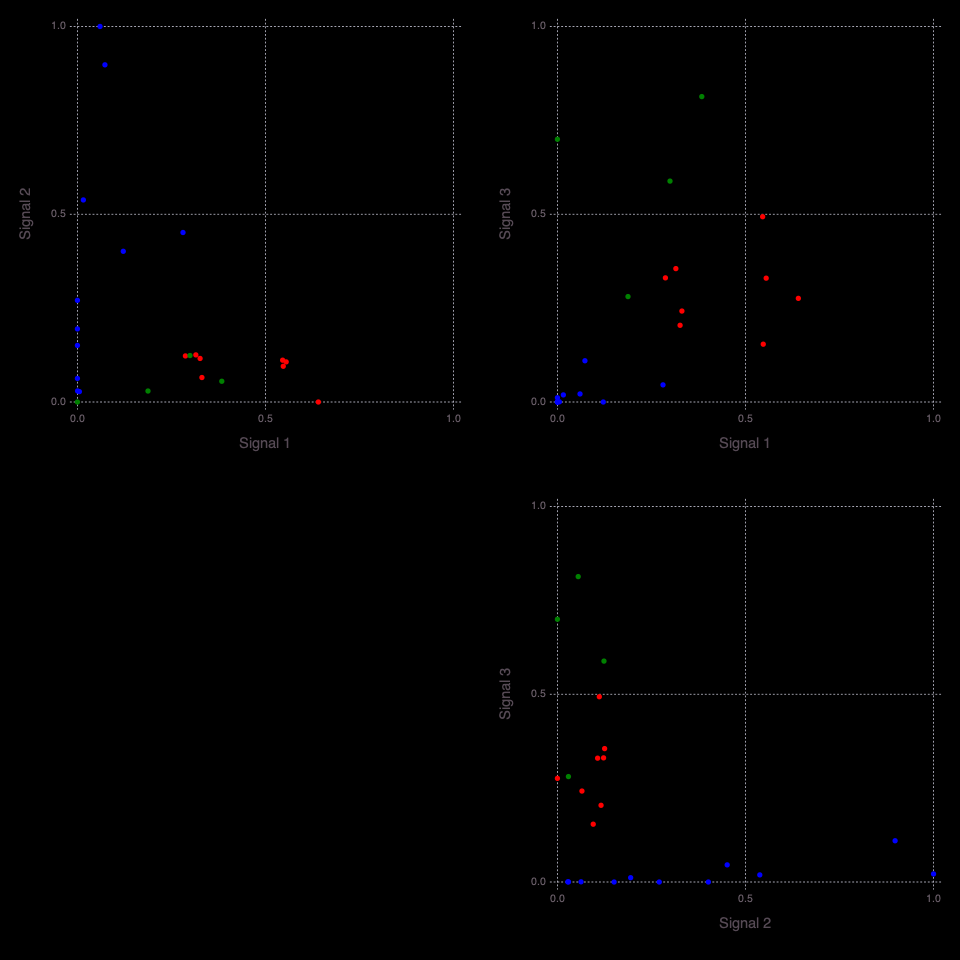

┌ Warning: H matrix dendrogram ploting failed!
└ @ NMFk /Users/ahmmedb/.julia/packages/NMFk/qlpSw/src/NMFkPostprocess.jl:481


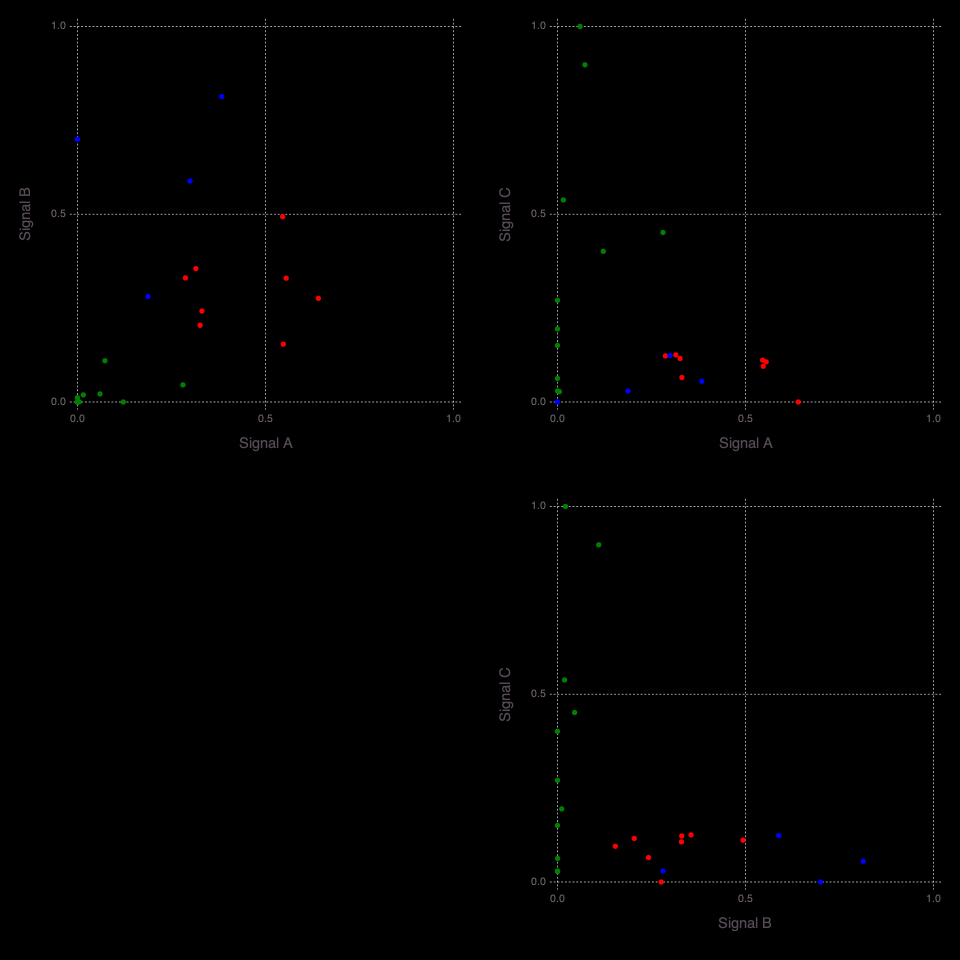

9170×2 Matrix{Any}:
 "6330"   1.0
 "6309"   0.973113
 "6424"   0.944102
 "6303"   0.925956
 "6294"   0.924531
 "6917"   0.915285
 "6539"   0.915097
 "6145"   0.915011
 "6320"   0.914496
 "6433"   0.910629
 ⋮        
 "180"    0.299319
 "134"    0.296425
 "14030"  0.294635
 "216"    0.284076
 "5359"   0.277254
 "13809"  0.265547
 "13862"  0.262234
 "5551"   0.259146
 "5474"   0.252151

2871×2 Matrix{Any}:
 "8938"   1.0
 "9190"   0.995968
 "9603"   0.977054
 "9159"   0.910273
 "12661"  0.907928
 "9587"   0.904558
 "9581"   0.894798
 "9124"   0.891079
 "9269"   0.88996
 "9108"   0.885692
 ⋮        
 "13980"  0.184785
 "178"    0.18327
 "217"    0.174851
 "5469"   0.162152
 "8096"   0.157424
 "442"    0.156764
 "5547"   0.151391
 "7612"   0.146165
 "5477"   0.117346

2217×2 Matrix{Any}:
 "7379"   1.0
 "7532"   0.993218
 "7078"   0.993132
 "7368"   0.992732
 "7515"   0.990666
 "7557"   0.989396
 "7576"   0.989188
 "7522"   0.987498
 "7581"   0.985837
 "7508"   0.985263
 ⋮        
 "12139"  0.115522
 "7598"   0.115101
 "12470"  0.11219
 "12526"  0.111707
 "12240"  0.110809
 "10089"  0.101395
 "8702"   0.101114
 "10093"  0.101089
 "10091"  0.0926155

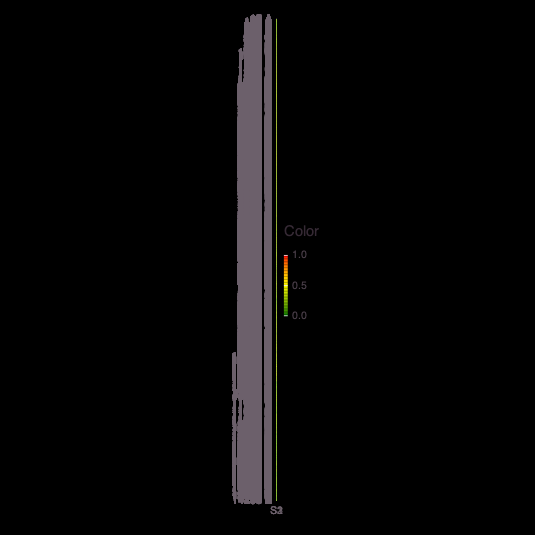

┌ Info: Locations (signals=3)
└ @ NMFk /Users/ahmmedb/.julia/packages/NMFk/qlpSw/src/NMFkPostprocess.jl:496
┌ Info: Signal A (S1) Count: 9170
└ @ NMFk /Users/ahmmedb/.julia/packages/NMFk/qlpSw/src/NMFkPostprocess.jl:509
┌ Info: Signal B (S3) Count: 2871
└ @ NMFk /Users/ahmmedb/.julia/packages/NMFk/qlpSw/src/NMFkPostprocess.jl:509
┌ Info: Signal C (S2) Count: 2217
└ @ NMFk /Users/ahmmedb/.julia/packages/NMFk/qlpSw/src/NMFkPostprocess.jl:509
┌ Info: Signal A -> A Count: 9170
└ @ NMFk /Users/ahmmedb/.julia/packages/NMFk/qlpSw/src/NMFkPostprocess.jl:519
┌ Info: Signal B -> B Count: 2871
└ @ NMFk /Users/ahmmedb/.julia/packages/NMFk/qlpSw/src/NMFkPostprocess.jl:519
┌ Info: Signal C -> C Count: 2217
└ @ NMFk /Users/ahmmedb/.julia/packages/NMFk/qlpSw/src/NMFkPostprocess.jl:519
┌ Info: Signal A (remapped k-means clustering)
└ @ NMFk /Users/ahmmedb/.julia/packages/NMFk/qlpSw/src/NMFkPostprocess.jl:534
┌ Info: Signal B (remapped k-means clustering)
└ @ NMFk /Users/ahmmedb/.julia/packages/NMFk/qlp

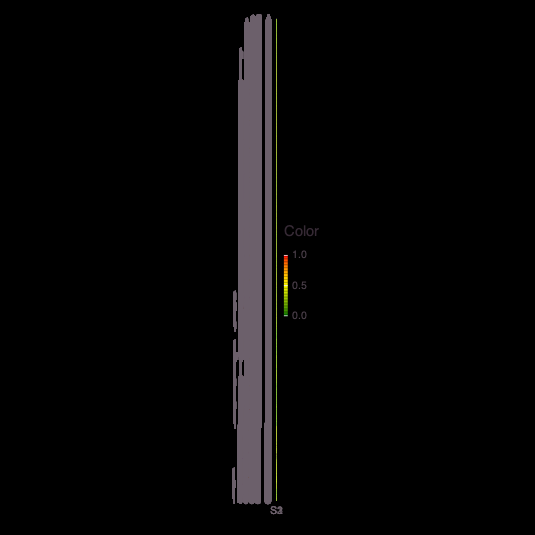

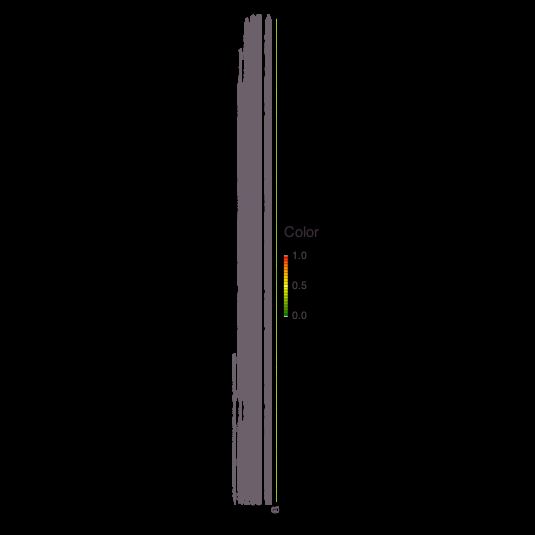

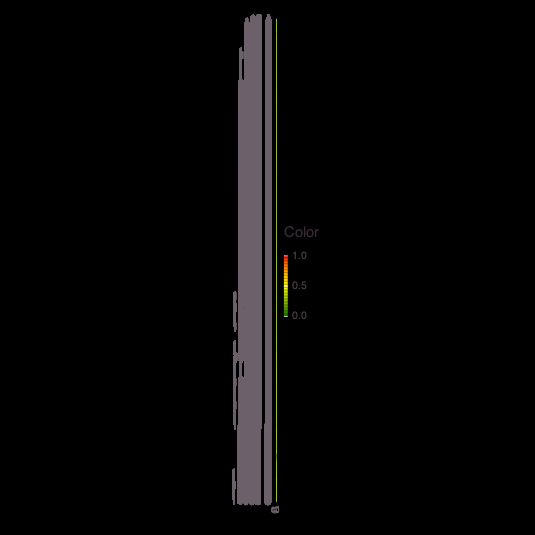

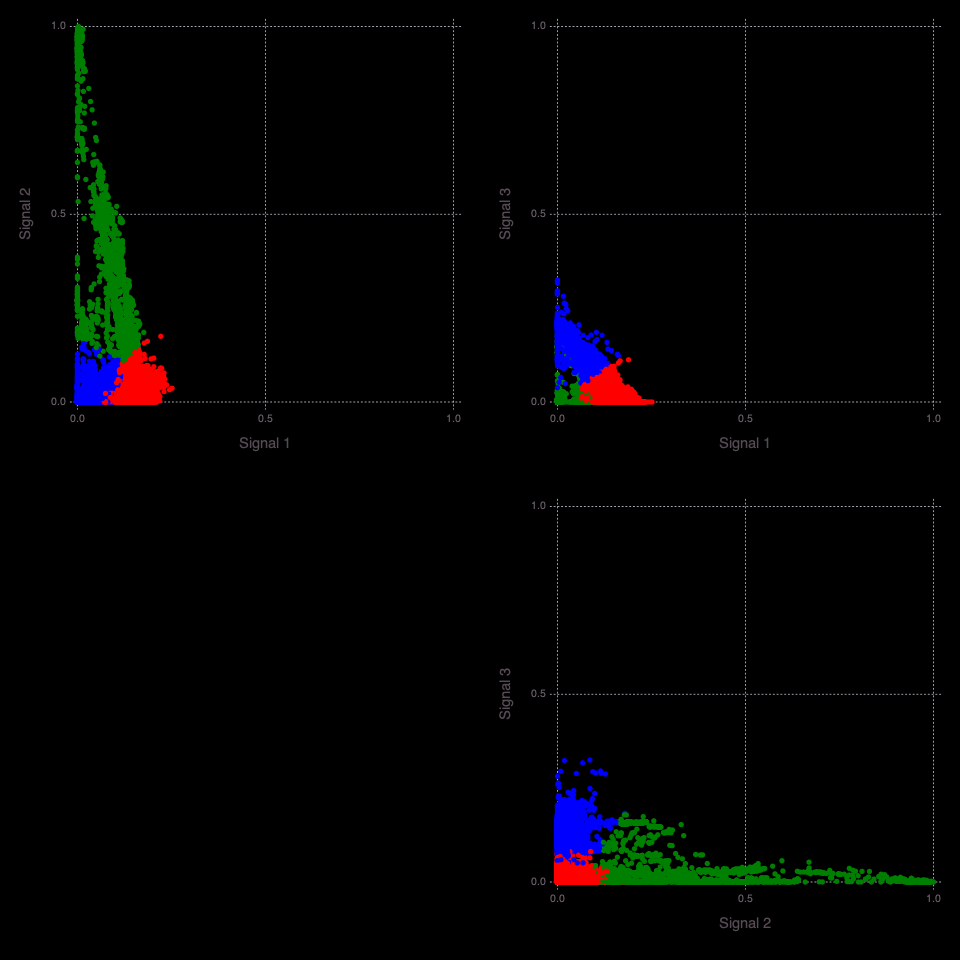

┌ Warning: W matrix dendrogram ploting failed!
└ @ NMFk /Users/ahmmedb/.julia/packages/NMFk/qlpSw/src/NMFkPostprocess.jl:599


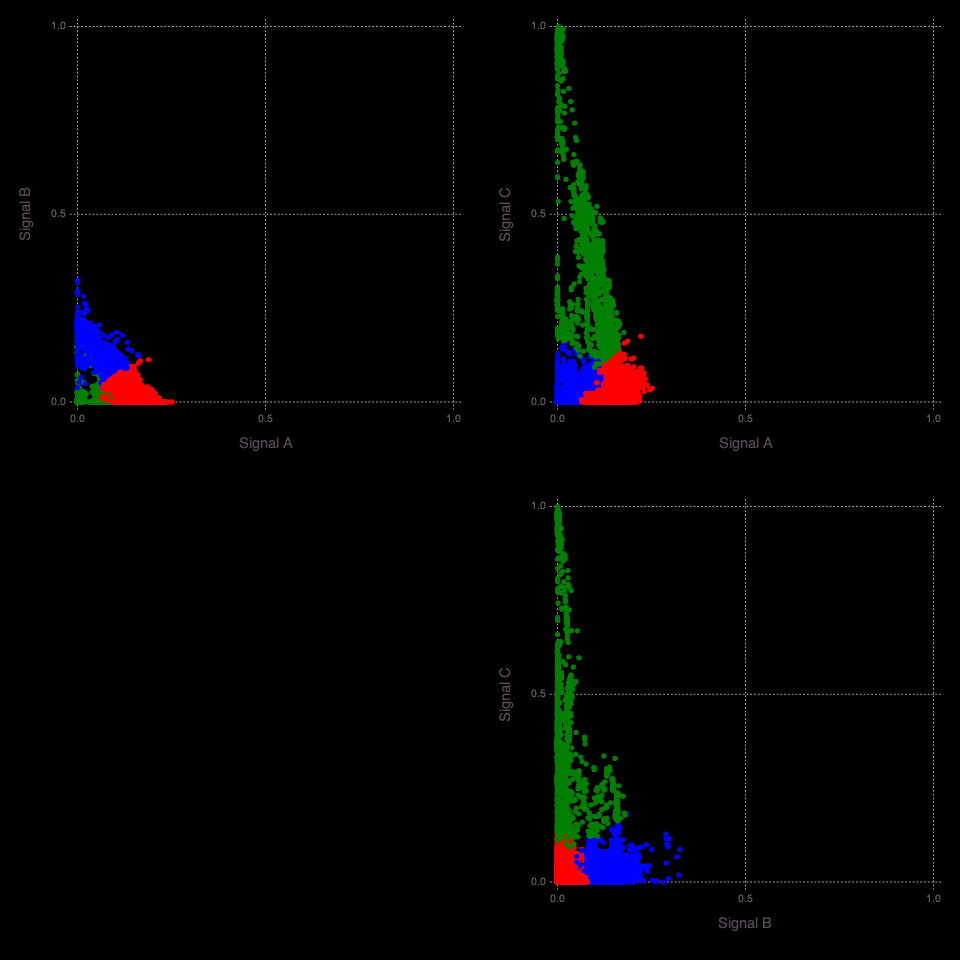

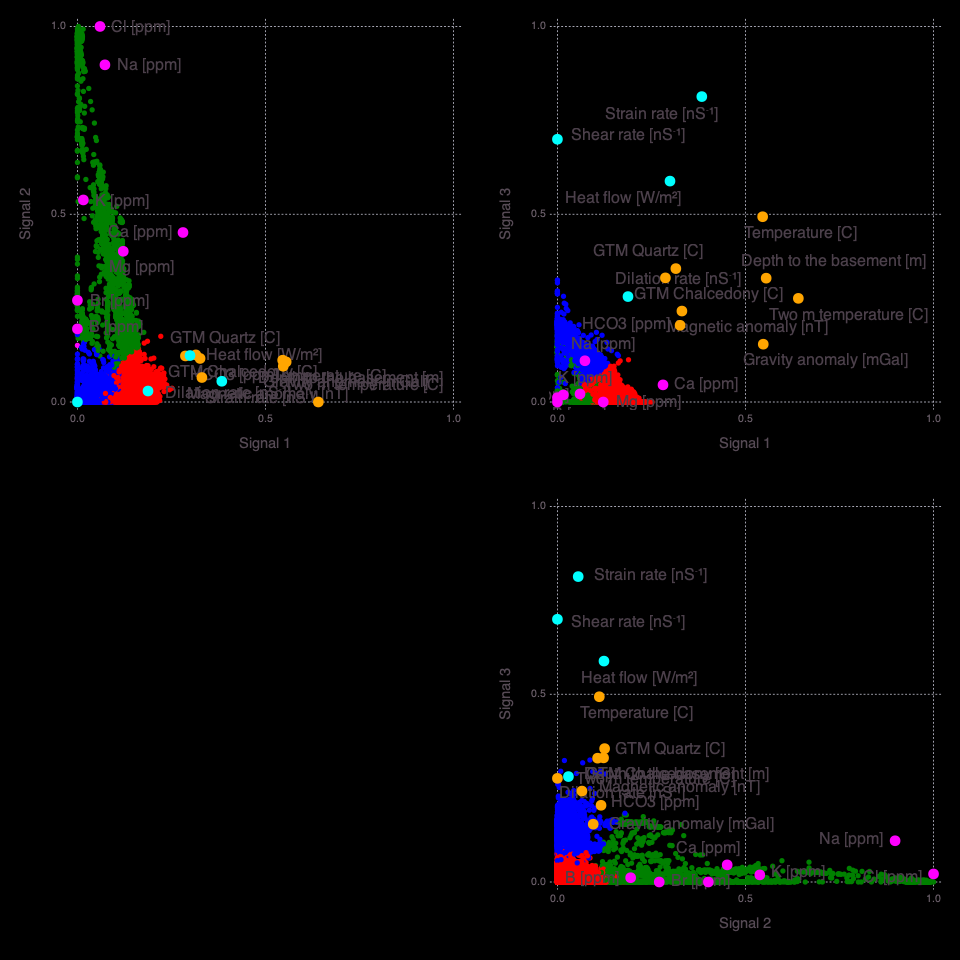

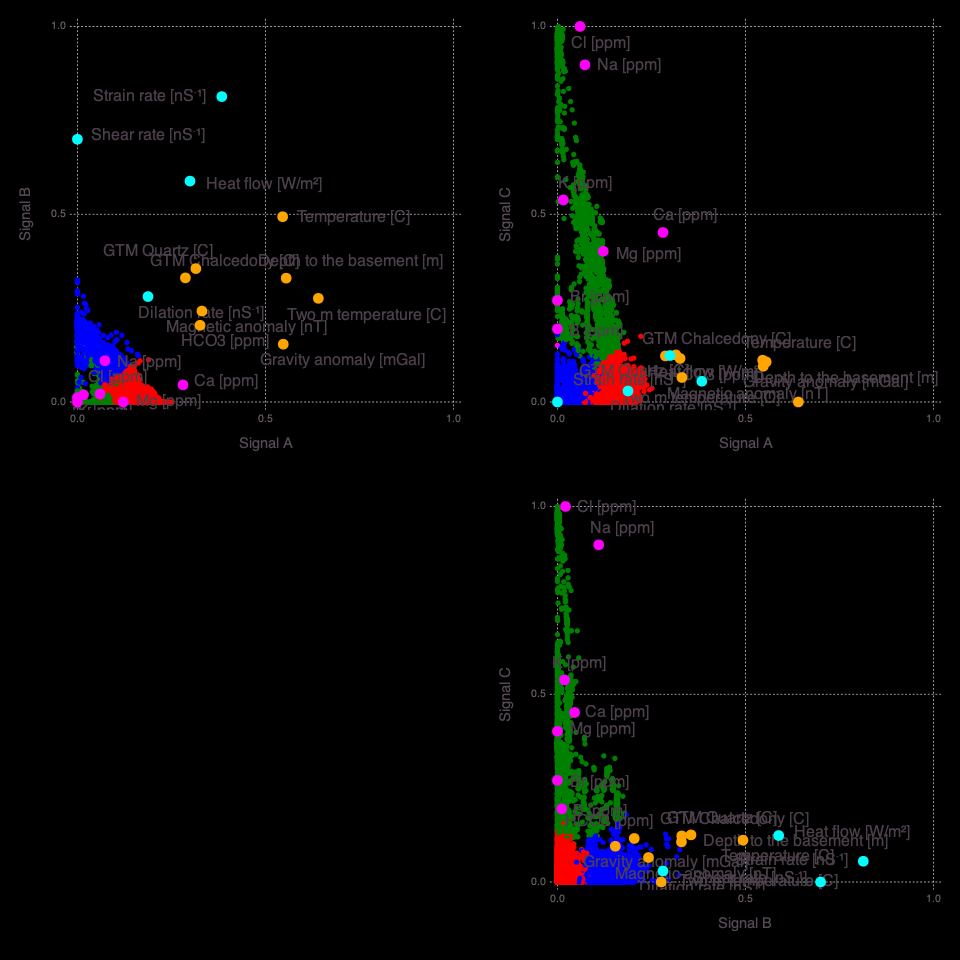

([[1, 3, 2]], [['A', 'A', 'A', 'A', 'A', 'A', 'A', 'A', 'A', 'A'  …  'B', 'B', 'B', 'A', 'B', 'A', 'A', 'B', 'B', 'A']], [['A', 'A', 'A', 'C', 'C', 'C', 'C', 'C', 'C', 'C'  …  'C', 'C', 'B', 'A', 'A', 'A', 'A', 'B', 'B', 'B']])

In [78]:
Sorder, Wclusters, Hclusters = NMFk.clusterresults(NMFk.getks(nkrange, robustness[nkrange], 0.5), W, H, string.(collect(1:npoints)), attributes_all; lon=xcoords, lat=ycoords, resultdir=resultdirpost, figuredir=figuredirpost, ordersignal=:Wcount, Hcasefilename="attributes", Wcasefilename="locations", biplotcolor=:WH, sortmag=false, biplotlabel=:H, point_size_nolabel=2Gadfly.pt, point_size_label=4Gadfly.pt)

The geothermal attributes are clustered into **3** groups:

In [52]:
Mads.display("$(resultdirpost)/attributes-6-groups.txt")

Signal A (S3)
Depth to the basement [m]	1.0
Strain rate [nS⁻¹]       	0.704
Dilation rate [nS⁻¹]     	0.432

Signal B (S2)
Heat flow [W/m²]         	1.0
Temperature [C]          	0.716
GTM Quartz [C]           	0.594
GTM Chalcedony [C]       	0.554
Magnetic anomaly [nT]    	0.495
HCO3 [ppm]               	0.364

Signal C (S6)
Shear rate [nS⁻¹]        	1.0

Signal D (S5)
Na [ppm]                 	1.0
Cl [ppm]                 	0.972
K [ppm]                  	0.577
Br [ppm]                 	0.313
B [ppm]                  	0.243
Li [ppm]                 	0.163
Al [ppm]                 	0.0723
Be [ppm]                 	0.0322
Ba [ppm]                 	0.0258

Signal E (S1)
Two m temperature [C]    	1.0
Gravity anomaly [mGal]   	0.33

Signal F (S4)
Ca [ppm]                 	1.0
Mg [ppm]                 	0.679



#### This grouping is based on analyses of the attribute matrix `W`:

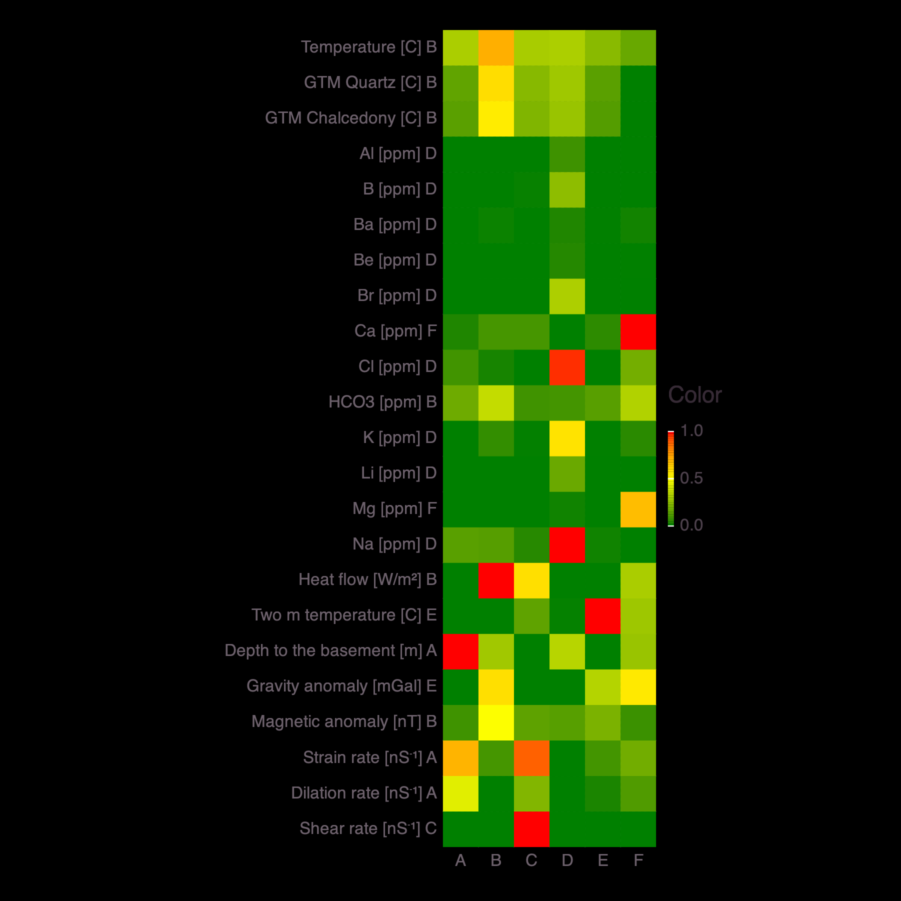

In [56]:
Mads.display("$(figuredirpost)/attributes-6-labeled.png")

#### The well locations are also clustered into **6** groups; the grouping is based on analyses of the location matrix `H`.
#### A spatial map of the locations is obtained:

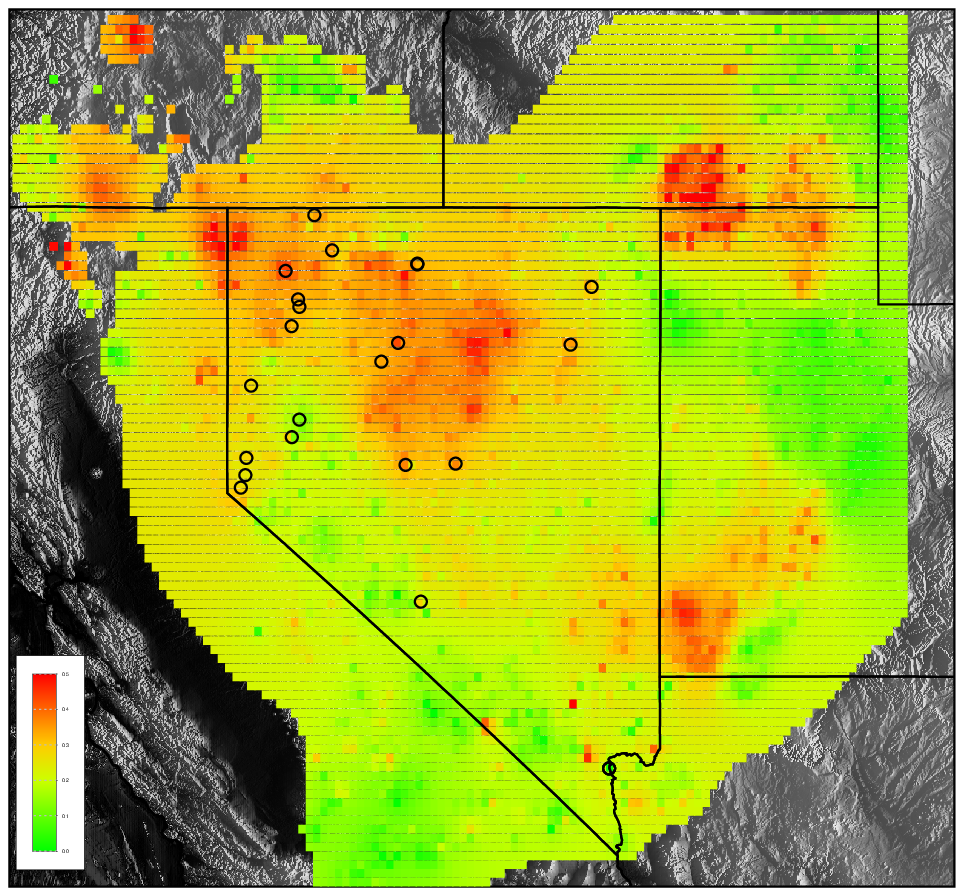

In [57]:
Mads.display("$(mapdirpost)/signatures-pfa-comparison-6-no-spring-label-B.png")

# We are successful in predicting both coarse resolution data like this and fine resolution data like Brady geothermal field in Nevada.
### Machine learning to identify geologic factors associated with production in geothermal fields: a case-study using 3D geologic data, Brady geothermal field, Nevada
- Link: https://link.springer.com/article/10.1186/s40517-021-00199-8